In [42]:
# import libraries

import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None



# read in the data
df = pd.read_csv(r'C:\Users\34753\Downloads\movies.csv')

In [2]:
df

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,votes,writer,year
0,8000000.0,Columbia Pictures Corporation,USA,Rob Reiner,Adventure,52287414.0,Stand by Me,R,1986-08-22,89,8.1,Wil Wheaton,299174,Stephen King,1986
1,6000000.0,Paramount Pictures,USA,John Hughes,Comedy,70136369.0,Ferris Bueller's Day Off,PG-13,1986-06-11,103,7.8,Matthew Broderick,264740,John Hughes,1986
2,15000000.0,Paramount Pictures,USA,Tony Scott,Action,179800601.0,Top Gun,PG,1986-05-16,110,6.9,Tom Cruise,236909,Jim Cash,1986
3,18500000.0,Twentieth Century Fox Film Corporation,USA,James Cameron,Action,85160248.0,Aliens,R,1986-07-18,137,8.4,Sigourney Weaver,540152,James Cameron,1986
4,9000000.0,Walt Disney Pictures,USA,Randal Kleiser,Adventure,18564613.0,Flight of the Navigator,PG,1986-08-01,90,6.9,Joey Cramer,36636,Mark H. Baker,1986
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6815,0.0,Fox Searchlight Pictures,UK,Mandie Fletcher,Comedy,4750497.0,Absolutely Fabulous: The Movie,R,2016-07-22,91,5.4,Jennifer Saunders,9161,Jennifer Saunders,2016
6816,0.0,Siempre Viva Productions,USA,Paul Duddridge,Drama,28368.0,Mothers and Daughters,PG-13,2016-05-06,90,4.9,Selma Blair,1959,Paige Cameron,2016
6817,3500000.0,Warner Bros. Animation,USA,Sam Liu,Animation,3775000.0,Batman: The Killing Joke,R,2016-07-25,76,6.5,Kevin Conroy,36333,Brian Azzarello,2016
6818,0.0,Borderline Presents,USA,Nicolas Pesce,Drama,25981.0,The Eyes of My Mother,R,2016-12-02,76,6.2,Kika Magalh�es,6947,Nicolas Pesce,2016


In [3]:
# What are highly corrrelated with the gross revenue


0       False
1       False
2       False
3       False
4       False
        ...  
6815    False
6816    False
6817    False
6818    False
6819    False
Name: budget, Length: 6820, dtype: bool
0       False
1       False
2       False
3       False
4       False
        ...  
6815    False
6816    False
6817    False
6818    False
6819    False
Name: company, Length: 6820, dtype: bool
0       False
1       False
2       False
3       False
4       False
        ...  
6815    False
6816    False
6817    False
6818    False
6819    False
Name: country, Length: 6820, dtype: bool
0       False
1       False
2       False
3       False
4       False
        ...  
6815    False
6816    False
6817    False
6818    False
6819    False
Name: director, Length: 6820, dtype: bool
0       False
1       False
2       False
3       False
4       False
        ...  
6815    False
6816    False
6817    False
6818    False
6819    False
Name: genre, Length: 6820, dtype: bool
0       False
1       False

In [7]:
# check any missing data

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print(f'{col} - {pct_missing}%')

0       False
1       False
2       False
3       False
4       False
        ...  
6815    False
6816    False
6817    False
6818    False
6819    False
Name: budget, Length: 6820, dtype: bool
budget - 0.0%
0       False
1       False
2       False
3       False
4       False
        ...  
6815    False
6816    False
6817    False
6818    False
6819    False
Name: company, Length: 6820, dtype: bool
company - 0.0%
0       False
1       False
2       False
3       False
4       False
        ...  
6815    False
6816    False
6817    False
6818    False
6819    False
Name: country, Length: 6820, dtype: bool
country - 0.0%
0       False
1       False
2       False
3       False
4       False
        ...  
6815    False
6816    False
6817    False
6818    False
6819    False
Name: director, Length: 6820, dtype: bool
director - 0.0%
0       False
1       False
2       False
3       False
4       False
        ...  
6815    False
6816    False
6817    False
6818    False
6819    False
Name: 

In [8]:
# data types for columns
df.dtypes

budget      float64
company      object
country      object
director     object
genre        object
gross       float64
name         object
rating       object
released     object
runtime       int64
score       float64
star         object
votes         int64
writer       object
year          int64
dtype: object

In [62]:
# change data type of col

df['budget'] = df['budget'].astype('int64')
df['gross'] = df['gross'].astype('int64')

In [14]:
df

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,votes,writer,year
0,8000000,Columbia Pictures Corporation,USA,Rob Reiner,Adventure,52287414,Stand by Me,R,1986-08-22,89,8.1,Wil Wheaton,299174,Stephen King,1986
1,6000000,Paramount Pictures,USA,John Hughes,Comedy,70136369,Ferris Bueller's Day Off,PG-13,1986-06-11,103,7.8,Matthew Broderick,264740,John Hughes,1986
2,15000000,Paramount Pictures,USA,Tony Scott,Action,179800601,Top Gun,PG,1986-05-16,110,6.9,Tom Cruise,236909,Jim Cash,1986
3,18500000,Twentieth Century Fox Film Corporation,USA,James Cameron,Action,85160248,Aliens,R,1986-07-18,137,8.4,Sigourney Weaver,540152,James Cameron,1986
4,9000000,Walt Disney Pictures,USA,Randal Kleiser,Adventure,18564613,Flight of the Navigator,PG,1986-08-01,90,6.9,Joey Cramer,36636,Mark H. Baker,1986
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6815,0,Fox Searchlight Pictures,UK,Mandie Fletcher,Comedy,4750497,Absolutely Fabulous: The Movie,R,2016-07-22,91,5.4,Jennifer Saunders,9161,Jennifer Saunders,2016
6816,0,Siempre Viva Productions,USA,Paul Duddridge,Drama,28368,Mothers and Daughters,PG-13,2016-05-06,90,4.9,Selma Blair,1959,Paige Cameron,2016
6817,3500000,Warner Bros. Animation,USA,Sam Liu,Animation,3775000,Batman: The Killing Joke,R,2016-07-25,76,6.5,Kevin Conroy,36333,Brian Azzarello,2016
6818,0,Borderline Presents,USA,Nicolas Pesce,Drama,25981,The Eyes of My Mother,R,2016-12-02,76,6.2,Kika Magalh�es,6947,Nicolas Pesce,2016


In [63]:
# create correct yeat column
df['year_correct'] = df['released'].astype(str).str[:4]

In [64]:
# order by gross revenue

pd.set_option('display.max_rows',None)
df.sort_values(by=['gross'],inplace=False,ascending=False)

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,votes,writer,year,year_correct
6380,245000000,1428,54,1037,0,936662225,4679,7,2290,136,8.1,475,687192,2356,2015,2290
5061,237000000,2062,53,1066,0,760507625,501,7,1800,162,7.8,2084,954412,1629,2009,1800
2420,200000000,2062,54,1066,6,658672302,6177,7,910,194,7.8,1444,862554,1629,1997,910
6391,150000000,2085,54,466,0,652270625,2721,7,2247,124,7.0,404,469200,3310,2015,2247
5723,220000000,1491,54,1412,0,623357910,4995,7,1987,143,8.1,2001,1064633,2145,2012,1987
4840,185000000,2123,54,440,0,534858444,5189,7,1696,152,9.0,408,1839571,2090,2008,1696
6614,200000000,1428,54,835,0,532177324,4206,7,2363,133,7.9,739,365473,625,2016,2363
6687,200000000,1720,54,128,2,486295561,1836,6,2328,97,7.4,678,173005,201,2016,2328
2870,115000000,1428,54,885,0,474544677,4675,6,1012,136,6.5,729,584809,1334,1999,1012
6398,250000000,1491,54,1412,0,459005868,502,7,2239,141,7.4,2001,537832,2145,2015,2239


In [46]:
# drop any duplicates

df = df.drop_duplicates()

In [ ]:
# Budget high correlation
# company high correlation



Text(0, 0.5, 'Budget For Film')

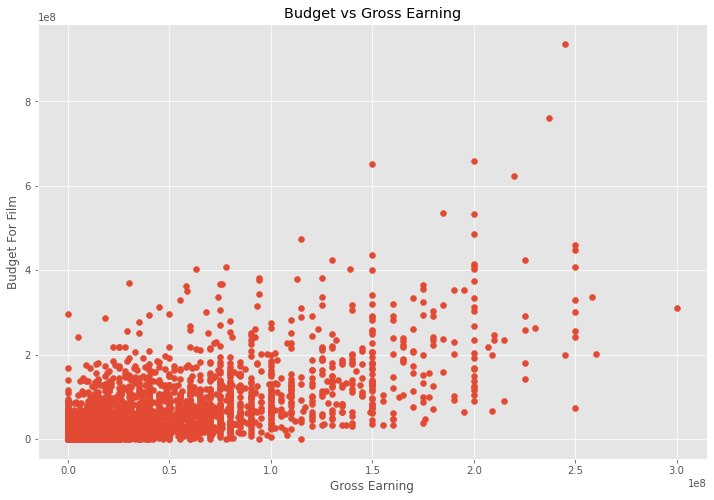

In [47]:
# scatter plot with budget vs gross

plt.scatter(x=df['budget'],y=df['gross'])
plt.title('Budget vs Gross Earning')
plt.xlabel('Gross Earning')
plt.ylabel('Budget For Film')

In [ ]:
# plot budget vs gross using seaborn

<AxesSubplot:xlabel='budget', ylabel='gross'>

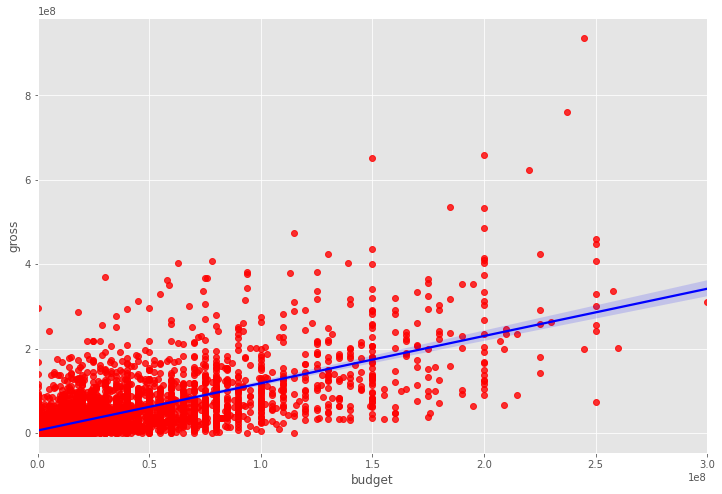

In [48]:
sns.regplot(x='budget',y='gross',data = df,scatter_kws={"color":"red"}, line_kws={"color":"blue"})

In [49]:
# look at correlation(on numerical col)

df.corr(method='pearson') # pearson,kendall, spearman

,budget,gross,runtime,score,votes,year
budget,1.000000,0.712196,0.268226,0.042145,0.503924,0.291009
gross,0.712196,1.000000,0.224579,0.165693,0.662457,0.191548
runtime,0.268226,0.224579,1.000000,0.395343,0.317399,0.087639
score,0.042145,0.165693,0.395343,1.000000,0.393607,0.105276
votes,0.503924,0.662457,0.317399,0.393607,1.000000,0.229304
year,0.291009,0.191548,0.087639,0.105276,0.229304,1.000000


In [53]:
# High correlation between budget and gross


Text(87.0, 0.5, 'Movie Features')

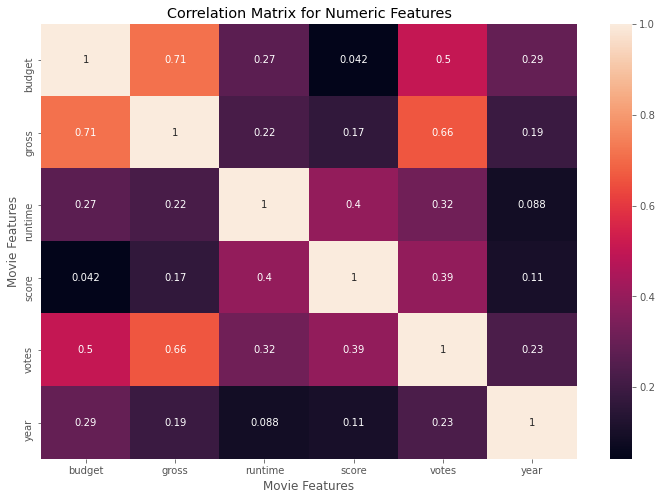

In [57]:
cor_mat = df.corr(method = 'pearson')
sns.heatmap(cor_mat,annot=True)

plt.title('Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')


In [65]:
# Look at company

df.head()

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,votes,writer,year,year_correct
0,8000000,665,54,2192,1,52287414,4661,8,39,89,8.1,2454,299174,3716,1986,39
1,6000000,1680,54,1296,4,70136369,1821,7,27,103,7.8,1605,264740,1970,1986,27
2,15000000,1680,54,2645,0,179800601,6203,6,23,110,6.9,2345,236909,1852,1986,23
3,18500000,2062,54,1066,0,85160248,295,8,33,137,8.4,2192,540152,1629,1986,33
4,9000000,2122,54,2123,1,18564613,1872,6,36,90,6.9,1139,36636,2549,1986,36


In [66]:
df_numerized = df

for col in df_numerized.columns:
    if df_numerized[col].dtype == 'object':
        df_numerized[col] = df_numerized[col].astype('category')
        df_numerized[col] = df_numerized[col].cat.codes
df_numerized

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,votes,writer,year,year_correct
0,8000000,665,54,2192,1,52287414,4661,8,39,89,8.1,2454,299174,3716,1986,1726
1,6000000,1680,54,1296,4,70136369,1821,7,27,103,7.8,1605,264740,1970,1986,1593
2,15000000,1680,54,2645,0,179800601,6203,6,23,110,6.9,2345,236909,1852,1986,1446
3,18500000,2062,54,1066,0,85160248,295,8,33,137,8.4,2192,540152,1629,1986,1660
4,9000000,2122,54,2123,1,18564613,1872,6,36,90,6.9,1139,36636,2549,1986,1693
5,6000000,1158,53,1948,6,138530565,3903,8,75,120,8.1,369,317585,2988,1986,2126
6,25000000,1160,53,1207,1,12729917,2883,6,30,101,7.4,528,102879,977,1986,1627
7,6000000,768,54,588,6,8551228,771,8,51,120,7.8,924,146768,897,1986,1860
8,9000000,1680,54,1004,4,40471663,3964,7,9,96,6.8,1730,60565,1970,1986,2292
9,15000000,1854,54,557,6,40456565,5306,8,38,96,7.5,1039,129698,1333,1986,1715


Text(86.59375, 0.5, 'Movie Features')

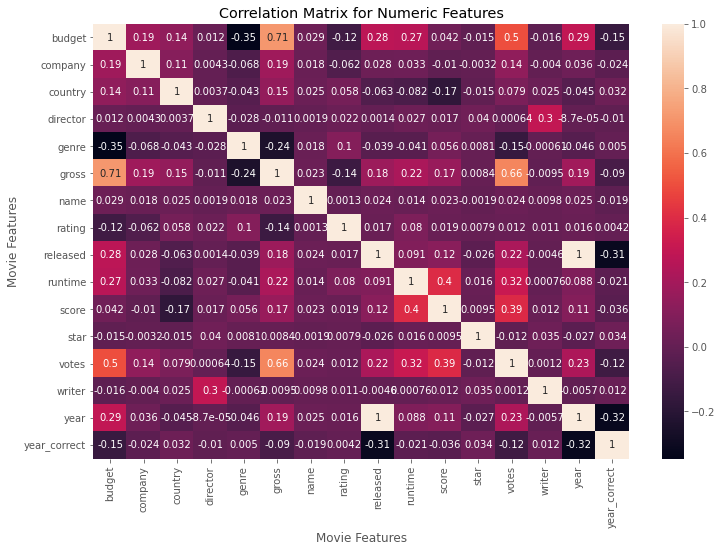

In [67]:
cor_mat = df_numerized.corr(method = 'pearson')
sns.heatmap(cor_mat,annot=True)

plt.title('Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')

In [70]:
corr_mat = df_numerized.corr()

corr_pairs = corr_mat.unstack()

corr_pairs

budget        budget          1.000000
              company         0.187205
              country         0.137635
              director        0.011602
              genre          -0.346794
              gross           0.712196
              name            0.028712
              rating         -0.119660
              released        0.276635
              runtime         0.268226
              score           0.042145
              star           -0.015062
              votes           0.503924
              writer         -0.015611
              year            0.291009
              year_correct   -0.146370
company       budget          0.187205
              company         1.000000
              country         0.107950
              director        0.004320
              genre          -0.068330
              gross           0.187220
              name            0.018098
              rating         -0.062250
              released        0.027898
              runtime    

In [72]:
sorted_pairs = corr_pairs.sort_values()

In [74]:
high_corr = sorted_pairs[(sorted_pairs) > 0.5]
high_corr

budget        votes           0.503924
votes         budget          0.503924
gross         votes           0.662457
votes         gross           0.662457
budget        gross           0.712196
gross         budget          0.712196
year          released        0.996187
released      year            0.996187
budget        budget          1.000000
writer        writer          1.000000
votes         votes           1.000000
star          star            1.000000
score         score           1.000000
runtime       runtime         1.000000
released      released        1.000000
rating        rating          1.000000
name          name            1.000000
gross         gross           1.000000
genre         genre           1.000000
director      director        1.000000
country       country         1.000000
company       company         1.000000
year          year            1.000000
year_correct  year_correct    1.000000
dtype: float64

In [ ]:
# votes and budget have the highest correlation to gross earnings
# company has low correlation
